In [2]:
pip install PyYAML


In [8]:
!pip install ultralytics



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

Modelo YOLOv8 carregado com sucesso!

 Processando: hamza-erbay-P5A-9mj4VLs-unsplash.jpg

0: 640x384 (no detections), 148.0ms
Speed: 7.4ms preprocess, 148.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 384)


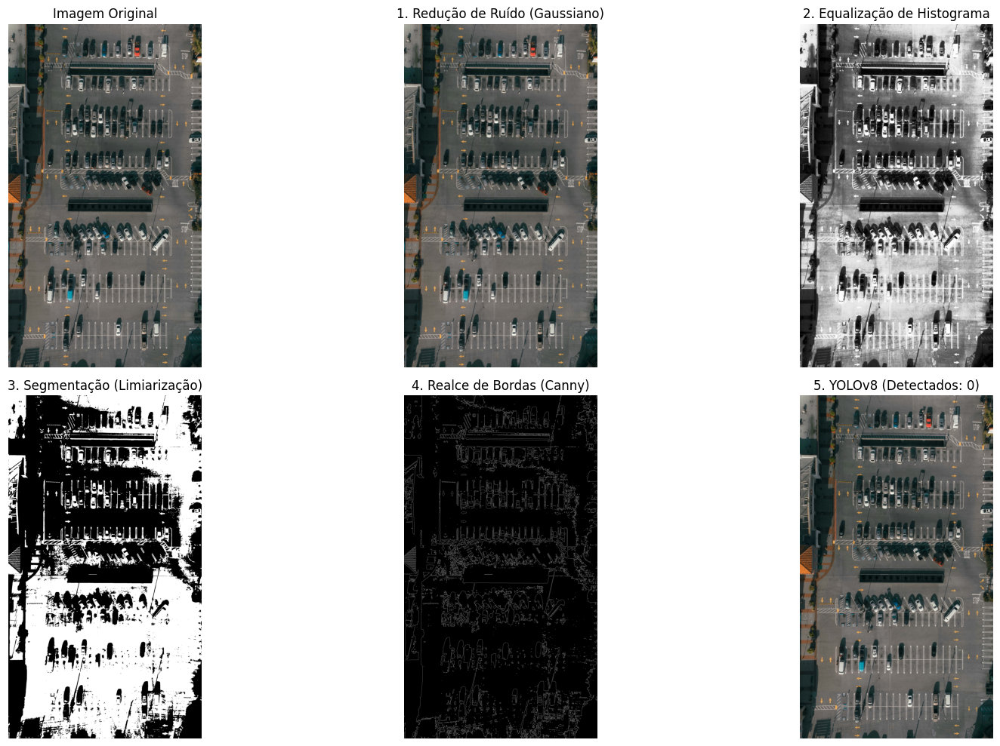


 Processando: jonny-gios-I7IchiBJXUo-unsplash.jpg

0: 640x512 3 suitcases, 503.1ms
Speed: 12.6ms preprocess, 503.1ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 512)


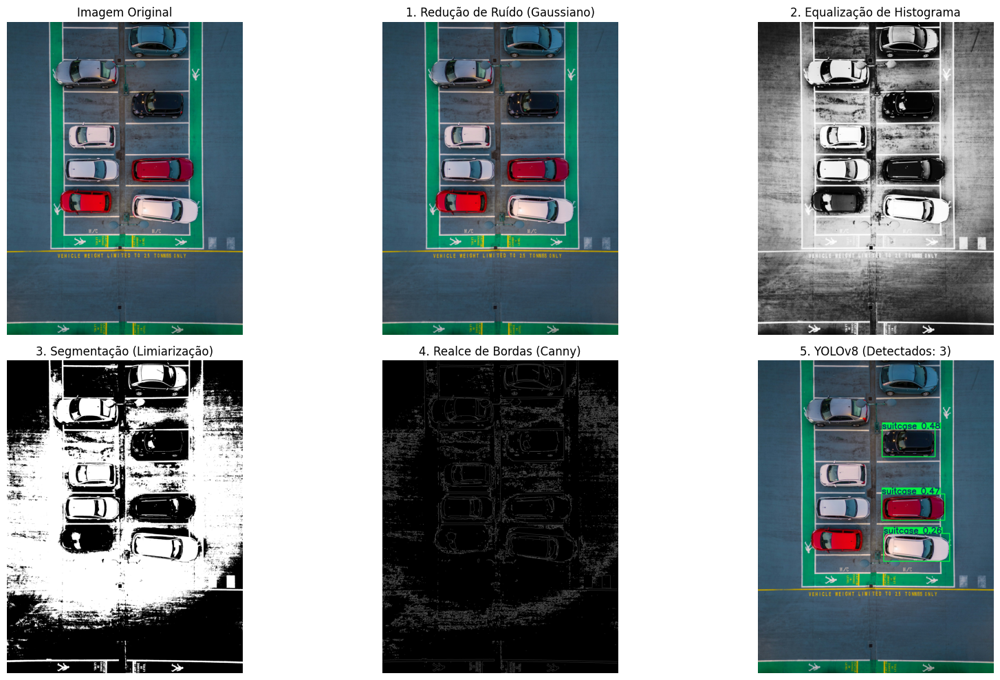


 Processando: laryssa-ares-ky1Pd0Sa-3Q-unsplash.jpg

0: 640x480 3 cars, 3 buss, 1 train, 2 traffic lights, 3 parking meters, 362.1ms
Speed: 9.3ms preprocess, 362.1ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 480)


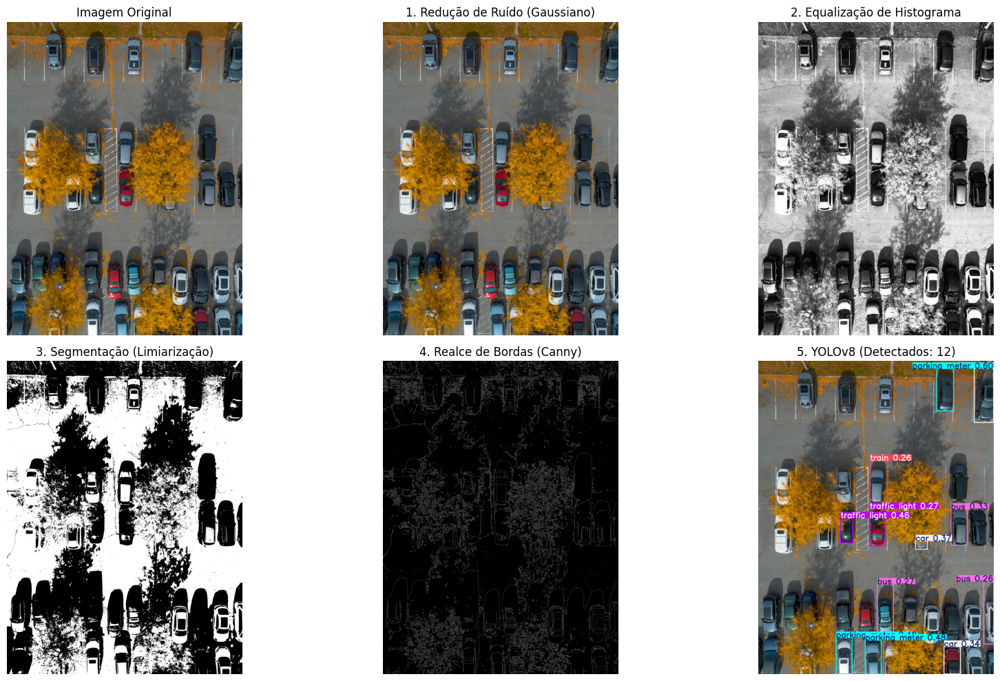


 Processando: minsoo-eun-iH92JD8RIwc-unsplash.jpg

0: 640x448 16 cars, 212.2ms
Speed: 9.5ms preprocess, 212.2ms inference, 5.6ms postprocess per image at shape (1, 3, 640, 448)


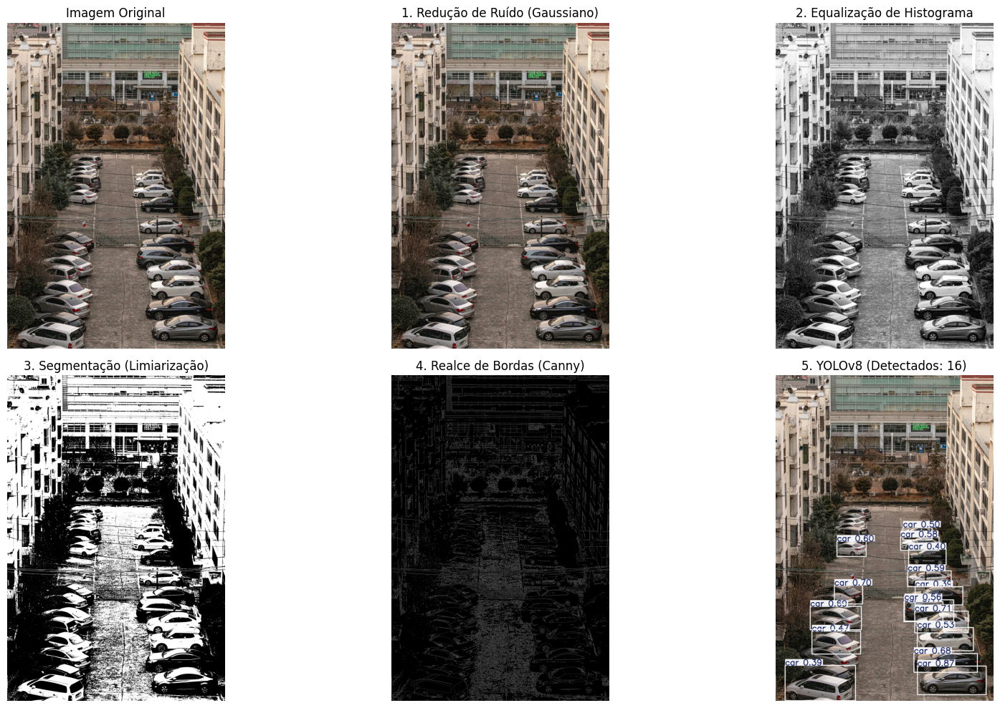


 Processando: m-vMneecAwo34-unsplash.jpg

0: 640x640 4 persons, 3 cars, 3 skateboards, 30 cell phones, 419.4ms
Speed: 10.0ms preprocess, 419.4ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 640)


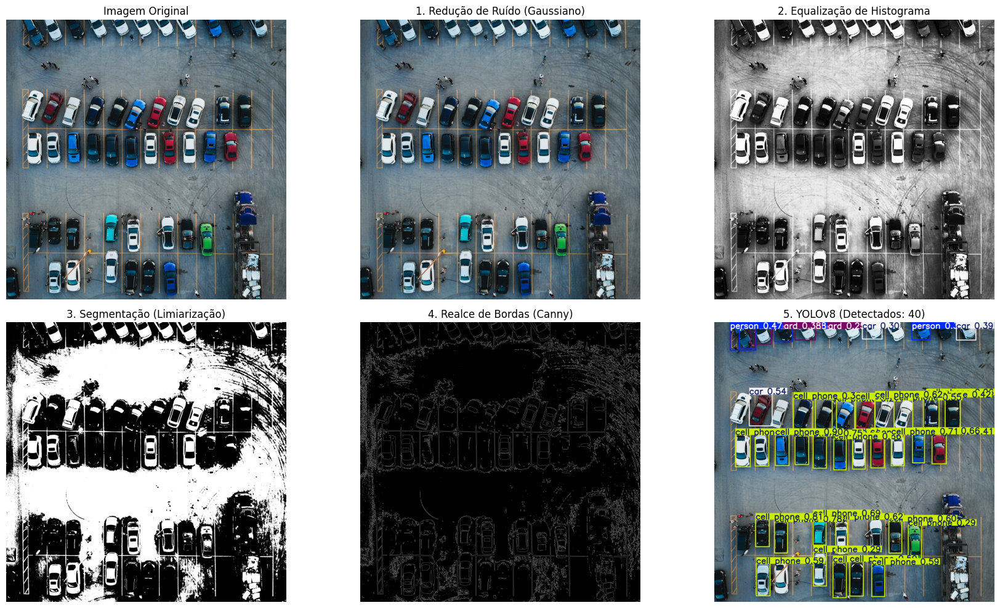

 Imagem não encontrada: ronan-furuta-R6BseBIz90o-unsplash.jpg


In [11]:
import cv2
import matplotlib.pyplot as plt  # Corrigido de 'plts' para 'plt'
from ultralytics import YOLO
import os

# Carrega modelo YOLO pré-treinado
try:
    model = YOLO('yolov8n.pt')
    print("Modelo YOLOv8 carregado com sucesso!")
except Exception as e:
    print(f"Erro ao carregar o modelo YOLO: {e}")
    exit()

# Lista de imagens (ajuste os caminhos conforme necessário)
image_paths = [
    "hamza-erbay-P5A-9mj4VLs-unsplash.jpg",
    "jonny-gios-I7IchiBJXUo-unsplash.jpg",
    "laryssa-ares-ky1Pd0Sa-3Q-unsplash.jpg",
    "minsoo-eun-iH92JD8RIwc-unsplash.jpg",
    "m-vMneecAwo34-unsplash.jpg",
    "ronan-furuta-R6BseBIz90o-unsplash.jpg"
]

def process_image(path):
    print(f"\n Processando: {path}")
    try:
        # Leitura da imagem
        image = cv2.imread(path)
        if image is None:
            raise FileNotFoundError(f"Não foi possível carregar a imagem: {path}")
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # 1. Redução de ruído com filtro Gaussiano
        blurred = cv2.GaussianBlur(image, (5, 5), 0)

        # 2. Conversão para escala de cinza e equalização do histograma
        gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
        equalized = cv2.equalizeHist(gray)

        # 3. Segmentação com limiarização simples
        _, segmented = cv2.threshold(equalized, 127, 255, cv2.THRESH_BINARY)

        # 4. Realce de bordas com Canny
        edges = cv2.Canny(segmented, 50, 150)

        # 5. Detecção com YOLOv8
        results = model(image)
        yolo_image = cv2.cvtColor(results[0].plot(), cv2.COLOR_BGR2RGB)  # Conversão para RGB
        yolo_car_count = len(results[0].boxes)

        # Visualização dos resultados
        fig, axs = plt.subplots(2, 3, figsize=(18, 10))
        axs[0, 0].imshow(image_rgb)
        axs[0, 0].set_title("Imagem Original")

        axs[0, 1].imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
        axs[0, 1].set_title("1. Redução de Ruído (Gaussiano)")

        axs[0, 2].imshow(equalized, cmap='gray')
        axs[0, 2].set_title("2. Equalização de Histograma")

        axs[1, 0].imshow(segmented, cmap='gray')
        axs[1, 0].set_title("3. Segmentação (Limiarização)")

        axs[1, 1].imshow(edges, cmap='gray')
        axs[1, 1].set_title("4. Realce de Bordas (Canny)")

        axs[1, 2].imshow(yolo_image)
        axs[1, 2].set_title(f"5. YOLOv8 (Detectados: {yolo_car_count})")

        for ax in axs.ravel():
            ax.axis('off')

        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Erro ao processar a imagem {path}: {e}")

# Processa todas as imagens fornecidas
for img_path in image_paths:
    if os.path.exists(img_path):
        process_image(img_path)
    else:
        print(f" Imagem não encontrada: {img_path}")